In [1808]:
import pandas as pd
import numpy as np
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import re

from sklearn.preprocessing import LabelEncoder


import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt

In [1809]:
df = pd.read_csv("../data/listings.csv", sep = ",")

## Data Cleaning

### [price] Dropping listings without price

In [1812]:
df.price.isna().sum()

972

In [1813]:
df = df.dropna(subset = "price")

### [price] Converting to Numeric Values

In [1815]:
# Price
df["price"] = df["price"].apply(lambda x: float(x[1:].replace(",","")) if pd.notna(x) else x)

### Host Features

In [1817]:
re_host = "host.*"

host_feat = []

for feat in df.columns:
    if re.match(re_host, feat):
         host_feat.append(feat)

host_drop = ["host_id", "host_url", "host_name", "host_location", "host_about", "host_thumbnail_url", 
             "host_picture_url", "host_neighbourhood", "host_since", "host_listings_count", "host_total_listings_count"]

df = df.drop(host_drop, axis = 1)

### Id Features

In [1819]:
re_id = ".*id.*"

id_feat = []

for feat in df.columns:
    if re.match(re_id, feat):
         id_feat.append(feat)

id_drop = ["id", "scrape_id"]

df = df.drop(id_drop, axis = 1)

### Url features

In [1821]:
re_url = ".*url.*"

url_feat = []

for feat in df.columns:
    if re.match(re_url, feat):
        url_feat.append(feat)
        
url_drop = ["listing_url", "picture_url"]

df = df.drop(url_drop, axis = 1)

### Others to drop

In [1823]:
## Majority missing values
feat_na = df.isna().sum()

print(feat_na[feat_na > 0].sort_values(ascending = False))

nas_drop = ["calendar_updated", "license", "neighbourhood_group_cleansed", "neighbourhood", "neighborhood_overview"]
df = df.drop(nas_drop, axis = 1)

calendar_updated                33692
license                         33692
neighbourhood_group_cleansed    33692
neighbourhood                   17123
neighborhood_overview           17123
review_scores_value              8101
review_scores_location           8099
review_scores_communication      8099
review_scores_checkin            8099
review_scores_cleanliness        8099
review_scores_accuracy           8099
first_review                     8090
review_scores_rating             8090
last_review                      8090
reviews_per_month                8090
host_response_rate               5605
host_response_time               5605
host_acceptance_rate             3431
description                      1130
host_is_superhost                 833
has_availability                  292
bathrooms_text                     39
bedrooms                           38
beds                               24
bathrooms                          23
dtype: int64


In [1824]:
feat_not_relevant = ["last_scraped", "source", "first_review", "last_review", "name", "description",
                    "calculated_host_listings_count", "calculated_host_listings_count_entire_homes",
                    "calculated_host_listings_count_private_rooms", "calculated_host_listings_count_shared_rooms", "calendar_last_scraped"]

# neighbourhood is better represented in neighbourhood_cleansed
df = df.drop(feat_not_relevant, axis = 1)

# EDA

In [1826]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 33692 entries, 0 to 34663
Data columns (total 44 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   host_response_time           28087 non-null  object 
 1   host_response_rate           28087 non-null  object 
 2   host_acceptance_rate         30261 non-null  object 
 3   host_is_superhost            32859 non-null  object 
 4   host_verifications           33692 non-null  object 
 5   host_has_profile_pic         33692 non-null  object 
 6   host_identity_verified       33692 non-null  object 
 7   neighbourhood_cleansed       33692 non-null  object 
 8   latitude                     33692 non-null  float64
 9   longitude                    33692 non-null  float64
 10  property_type                33692 non-null  object 
 11  room_type                    33692 non-null  object 
 12  accommodates                 33692 non-null  int64  
 13  bathrooms            

### Outliers (numerical)

In [1828]:
# Numerical
df_numerical = df.select_dtypes(exclude = 'object')
df_numerical.iloc[:, 0:15].describe()

,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm
count,33692.000000,33692.000000,33692.000000,33669.000000,33654.000000,33668.000000,33692.000000,33692.000000,33692.000000,33692.000000,33692.000000,33692.000000,33692.000000,33692.000000,33692.000000
mean,-22.967648,-43.248488,4.014573,1.552021,1.554228,2.273702,731.188235,3.609878,418.068651,3.313754,4.238454,514.388668,541.715452,3.660080,527.181221
std,0.034585,0.099622,2.338461,1.007791,1.048019,2.099953,5667.250477,13.741494,414.058955,11.496638,14.037076,451.965922,455.813598,12.376104,449.293283
min,-23.073276,-43.723009,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,-22.984630,-43.302590,2.000000,1.000000,1.000000,1.000000,199.000000,1.000000,60.000000,1.000000,2.000000,90.000000,90.000000,1.300000,90.000000
50%,-22.972959,-43.194267,4.000000,1.000000,1.000000,2.000000,307.000000,2.000000,365.000000,2.000000,3.000000,365.000000,365.000000,2.000000,365.000000
75%,-22.956848,-43.185430,5.000000,2.000000,2.000000,3.000000,572.000000,3.000000,365.000000,3.000000,4.000000,1125.000000,1125.000000,3.000000,1125.000000
max,-22.749950,-43.104400,16.000000,29.000000,30.000000,56.000000,633125.000000,1000.000000,1125.000000,630.000000,1125.000000,1125.000000,1125.000000,630.000000,1125.000000


In [1829]:
df_numerical.iloc[:, 15:].describe()

,availability_30,availability_60,availability_90,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month
count,33692.000000,33692.000000,33692.000000,33692.000000,33692.000000,33692.000000,33692.000000,25602.000000,25593.000000,25593.000000,25593.000000,25593.000000,25593.000000,25591.000000,25602.000000
mean,20.234240,43.837706,66.071916,205.605574,22.593078,7.761160,0.568978,4.802834,4.816552,4.765509,4.891744,4.881205,4.865371,4.720408,1.094172
std,10.940623,19.906377,27.822150,114.708959,44.422247,12.093625,1.149566,0.360016,0.356751,0.399811,0.281986,0.296750,0.290990,0.403923,1.200897
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.010000
25%,11.000000,32.000000,52.000000,90.000000,1.000000,0.000000,0.000000,4.750000,4.780000,4.690000,4.890000,4.880000,4.850000,4.650000,0.230000
50%,26.000000,54.000000,79.000000,193.000000,5.000000,2.000000,0.000000,4.920000,4.930000,4.900000,5.000000,5.000000,4.970000,4.820000,0.680000
75%,29.000000,59.000000,89.000000,322.000000,24.000000,11.000000,1.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1.550000
max,30.000000,60.000000,90.000000,365.000000,674.000000,132.000000,20.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,16.960000


In [1830]:
df_numerical.columns

Index(['latitude', 'longitude', 'accommodates', 'bathrooms', 'bedrooms',
       'beds', 'price', 'minimum_nights', 'maximum_nights',
       'minimum_minimum_nights', 'maximum_minimum_nights',
       'minimum_maximum_nights', 'maximum_maximum_nights',
       'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 'availability_30',
       'availability_60', 'availability_90', 'availability_365',
       'number_of_reviews', 'number_of_reviews_ltm', 'number_of_reviews_l30d',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'reviews_per_month'],
      dtype='object')

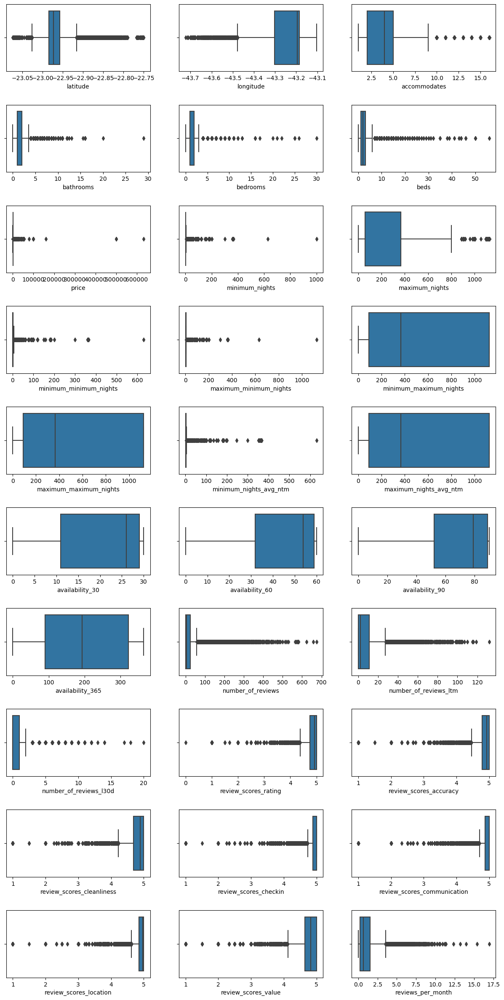

In [1831]:
fig, ax = plt.subplots(nrows = 10, ncols = 3, figsize=(15,30))
fig.subplots_adjust(hspace=0.5)

line = 0
col = 0
index = [0,0]
for feat in df_numerical:        
    #Plot boxplot of current feature
    sns.boxplot(data = df,x = feat, ax = ax[line, col])
        
    #Update index for plotting for the next iteration
    if(col + 1 == 3):
        col = 0
        line += 1
    else:
        col +=1

### [price] Outliers

count     33692.000000
mean        731.188235
std        5667.250477
min           0.000000
25%         199.000000
50%         307.000000
75%         572.000000
max      633125.000000
Name: price, dtype: float64


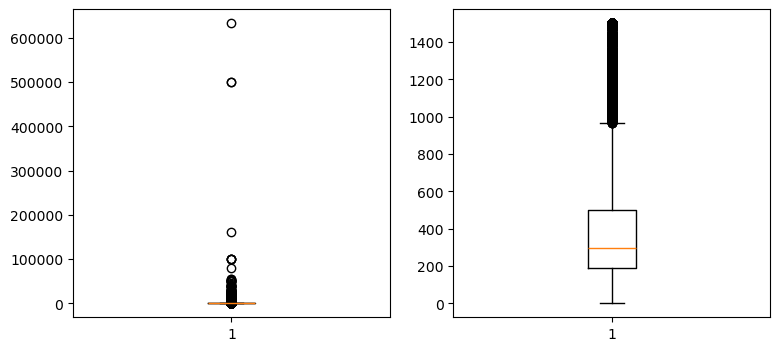

In [1833]:
# Outliers
PRICE_CAP = 1500
print(df.price.describe())

fig, axis = plt.subplots(nrows=1, ncols=2, figsize=(9, 4))

axis[0].boxplot(df.price)
axis[1].boxplot(df.loc[df.price <= PRICE_CAP,:].price)

plt.show()


### TO DO

df.price = df.price.apply(lambda x : x if x < PRICE_CAP else PRICE_CAP)

#df = df.loc[df.price <= PRICE_CAP,:]

### Distribution (categorical)

In [1835]:
df_categorical = df.select_dtypes(include = "object")
df_categorical = df_categorical.drop("amenities", axis = 1) #Will de dealt with later
df_categorical.columns

Index(['host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_verifications', 'host_has_profile_pic',
       'host_identity_verified', 'neighbourhood_cleansed', 'property_type',
       'room_type', 'bathrooms_text', 'has_availability', 'instant_bookable'],
      dtype='object')

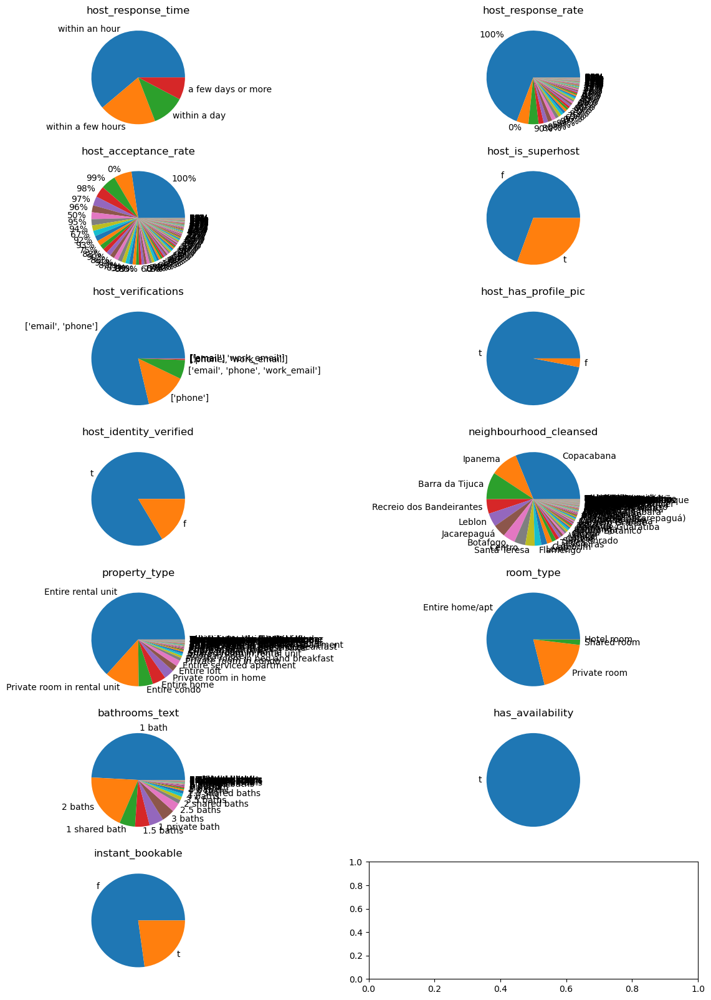

In [1836]:
fig, ax = plt.subplots(nrows = 7, ncols = 2, figsize = (15,20))

line = 0
col = 0

for feat in df_categorical:
    
    ax[line,col].pie(df[feat].value_counts(), labels = df[feat].value_counts().index)
    ax[line,col].title.set_text(feat)
    
    if(col + 1  == 2):
        col = 0
        line += 1
    else:
        col +=1

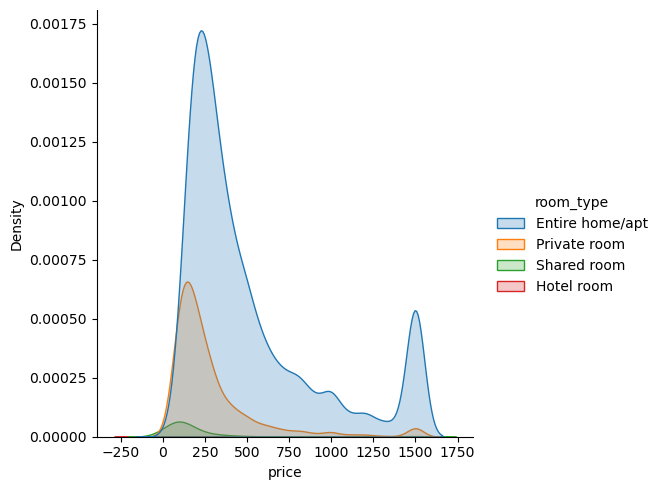

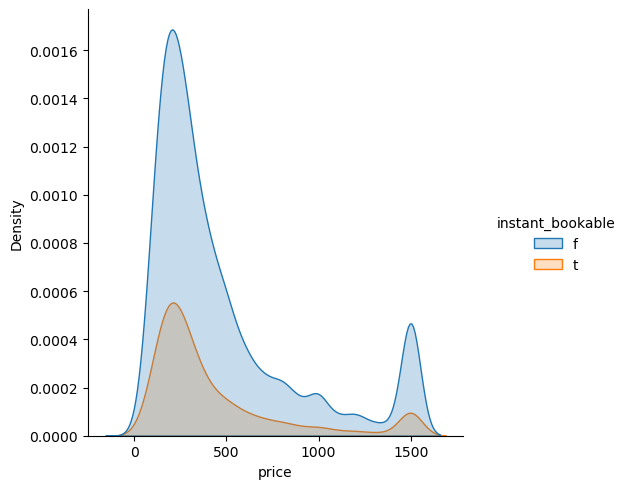

In [1837]:
sns.displot(df, x = "price", hue = "room_type", kind = "kde", fill = "True")
sns.displot(df, x = "price", hue = "instant_bookable", kind = "kde", fill = "True")



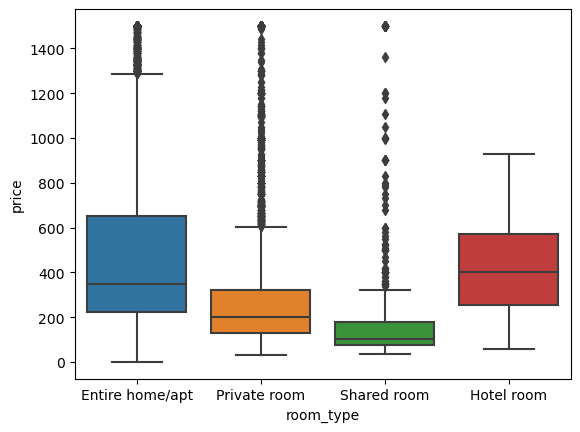

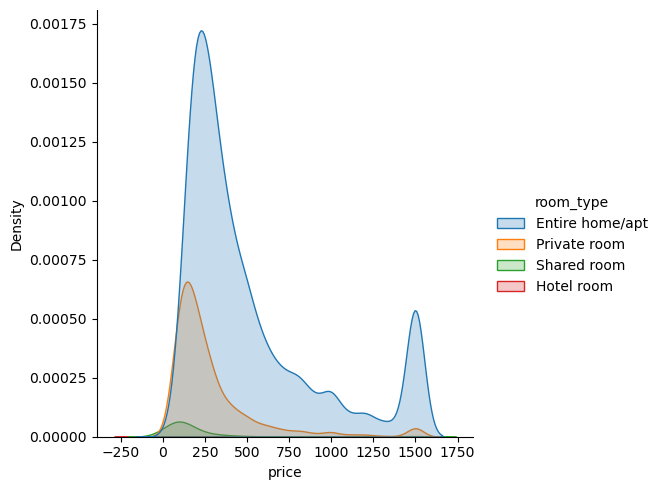

In [1838]:
#Checking skeweness
sns.boxplot(data = df, x = df["room_type"], y=df.price)

# Distribution of Data
sns.displot(df, x = "price", hue = "room_type", kind = "kde", fill = "True")

#sns.displot(penguins, x="flipper_length_mm", hue="species", kind="kde")

<Axes: xlabel='accommodates', ylabel='price'>

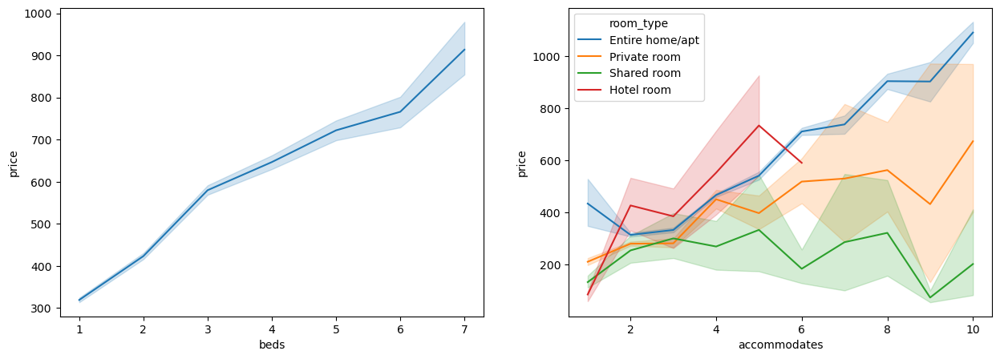

In [1839]:
fig, ax = plt.subplots(1,2, figsize=(15,5))

# Min 1 bed and max 7 beds
sns.lineplot(ax =ax[0] , data = df.loc[(df.beds <=7) & (df.beds > 0),:], x="beds", y="price")

# Min 1 ppl and max 10 ppl
sns.lineplot(ax = ax[1], data = df.loc[(df.accommodates <=10) & (df.accommodates > 0),:], x="accommodates", y="price", hue = "room_type")

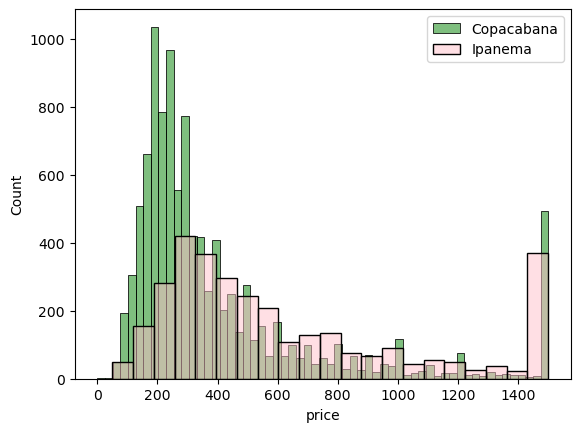

In [1840]:
sns.histplot(df.loc[df.neighbourhood_cleansed == "Copacabana",:], x = "price", color = "green", alpha = 0.5)
sns.histplot(df.loc[df.neighbourhood_cleansed == "Ipanema",:], x = "price", color = "pink", alpha= 0.5)
plt.legend(['Copacabana', 'Ipanema'],loc="upper right")

In [1841]:
#Cross tab
pd.crosstab(index = df.neighbourhood_cleansed, columns = df.room_type).sort_values("Entire home/apt", ascending = False).head(10)

room_type,Entire home/apt,Hotel room,Private room,Shared room
neighbourhood_cleansed,,,,
Copacabana,8882,1,1496,123
Ipanema,2832,1,369,24
Barra da Tijuca,2667,4,469,10
Leblon,1454,2,118,1
Recreio dos Bandeirantes,1388,0,287,19
Jacarepaguá,1164,1,291,30
Centro,1080,6,180,22
Botafogo,980,4,401,26
Flamengo,609,0,161,11


In [1842]:
# Pivot Table
pivot_df = pd.pivot_table(df, values = "price",
                   index = "neighbourhood_cleansed",
                   aggfunc = "mean").sort_values(by = "price", ascending = False)

#Series with the counts
counts = df.neighbourhood_cleansed.value_counts()

#Merge occurancies with price grouped by the neighbourhood
pivot_df.merge(counts, left_on = "neighbourhood_cleansed", right_on = "neighbourhood_cleansed").head(5)

,price,count
neighbourhood_cleansed,,
Joá,1232.417266,139
Galeão,1083.333333,3
São Conrado,842.252427,309
Anchieta,719.333333,3
Lagoa,687.066929,254


#### Number of Nights (Outliers)

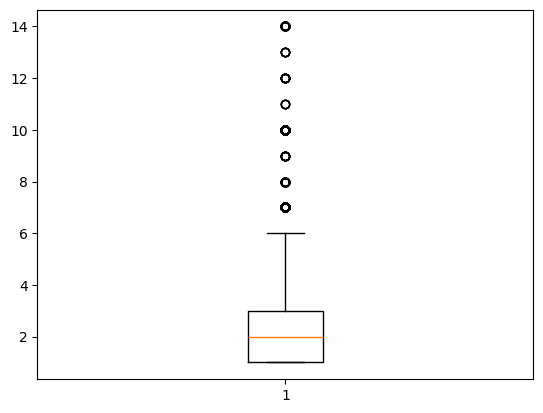

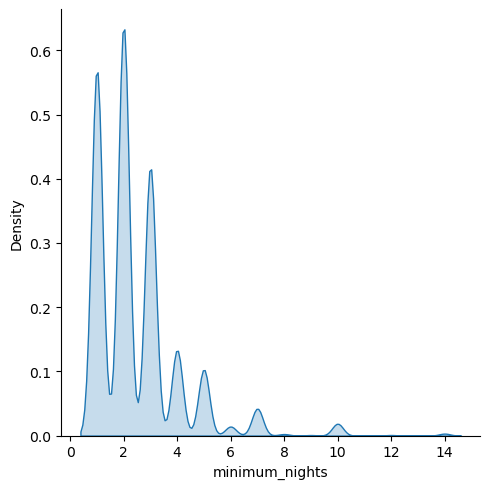

In [1844]:
plt.boxplot(df.loc[df.minimum_nights <= 14, "minimum_nights"])

sns.displot(df.loc[df.minimum_nights <= 14, :], x = "minimum_nights", kind = "kde", fill = "True")

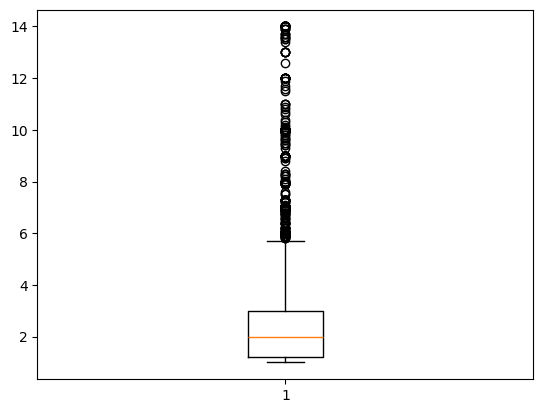

In [1845]:
### Introducing a CAP indicating 14+

CAP = 14

plt.boxplot(df.loc[df.minimum_nights_avg_ntm <= CAP, "minimum_nights_avg_ntm"])

df = df.loc[df.minimum_nights_avg_ntm <= CAP, :]
#df = [df.maximum_nights_avg_ntm <= CAP, :]

In [1846]:
# minimum_nights
# minimum_minimum_nights
# minimum_maximum_nights
# minimum_nights_avg_ntm

df[[x for x in df.columns if re.match("minimum.*", x)]]

,minimum_nights,minimum_minimum_nights,minimum_maximum_nights,minimum_nights_avg_ntm
0,5,5,28,5.0
1,2,2,60,2.0
2,1,1,1125,1.0
3,3,3,15,3.0
4,1,5,1125,5.4
...,...,...,...,...
34659,2,2,365,2.5
34660,2,2,365,2.0
34661,2,2,15,2.1
34662,2,2,365,2.0


In [1847]:
# Values are pretty much the same (differnce = 0)
print(df.apply(lambda x: x["minimum_nights"] - x["minimum_minimum_nights"], axis = 1).value_counts())

#Values are pretty much all captured with minimum_nights and maximum_nights
drop_min_max = ["minimum_minimum_nights", "maximum_minimum_nights", "minimum_maximum_nights", "maximum_maximum_nights", "maximum_nights_avg_ntm"]

df = df.drop(drop_min_max, axis = 1)

 0      29099
 1       1963
 2        705
-1        428
 3        223
 4        111
-2        104
 5         30
 6         27
-3         23
-4         17
 8          7
 9          6
 7          5
 13         5
-5          5
 25         4
 12         4
 28         3
 11         3
 23         3
 27         2
 14         2
 19         2
 26         2
-6          2
 998        1
 20         1
 59         1
 15         1
 17         1
 29         1
 199        1
 58         1
 361        1
 10         1
-12         1
Name: count, dtype: int64


In [1848]:
df.columns

Index(['host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_verifications', 'host_has_profile_pic',
       'host_identity_verified', 'neighbourhood_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_nights_avg_ntm',
       'has_availability', 'availability_30', 'availability_60',
       'availability_90', 'availability_365', 'number_of_reviews',
       'number_of_reviews_ltm', 'number_of_reviews_l30d',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'instant_bookable', 'reviews_per_month'],
      dtype='object')

### Location Analysis

In [1850]:
df.price.count()

32796

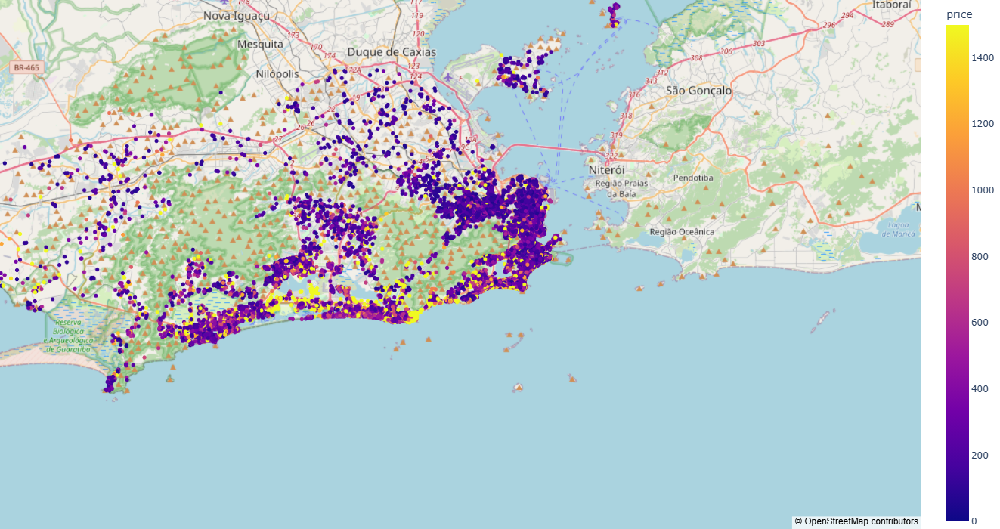

In [1851]:
fig = px.scatter_mapbox(df, 
                  lat="latitude", 
                  lon="longitude",     
                  color="price",  
                  size_max=15, 
                  zoom=10,
                  height = 700,
                  mapbox_style = "open-street-map")


fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
#fig.update_layout(mapbox_style="open-street-map")

### Outliers

##### Neighborhoods

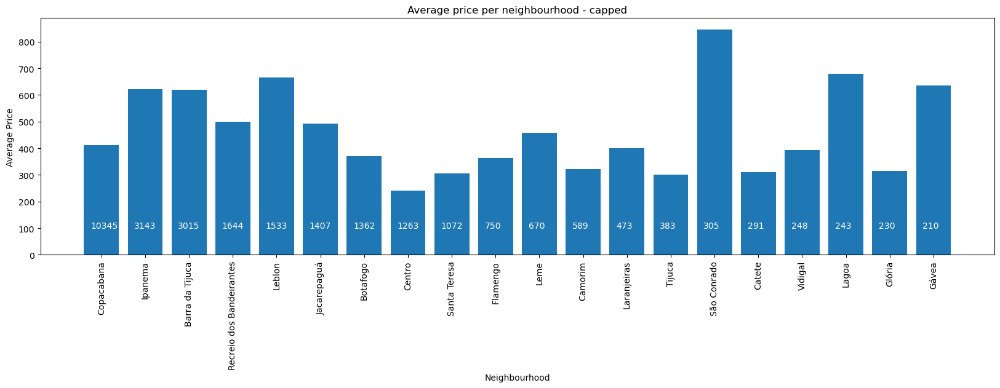

In [1854]:
NEIGHBOURHOOD_SAMPLES_CAP = 200

df_avg_neighbourhood = df[["neighbourhood_cleansed", "price"]].groupby("neighbourhood_cleansed").agg(count=('neighbourhood_cleansed','size'),
                                                                              price=('price', 'mean')).sort_values("count", ascending = False)
avg_neighbourhood = df_avg_neighbourhood.loc[df_avg_neighbourhood["count"] >= NEIGHBOURHOOD_SAMPLES_CAP].price
avg_neighbourhood_count = df_avg_neighbourhood.loc[df_avg_neighbourhood["count"] >= NEIGHBOURHOOD_SAMPLES_CAP]["count"]

sample_size = len(avg_neighbourhood.index)


plt.figure(figsize=(20, 5))
plt.bar(x = avg_neighbourhood.index, height = avg_neighbourhood)
labels = plt.xticks(rotation=90)

#Will display the count for each neighbourhood
for i in range(sample_size):
    plt.text(i-0.25,100, avg_neighbourhood_count[i], color = "white")

plt.title("Average price per neighbourhood - capped")
plt.ylabel("Average Price")
plt.xlabel("Neighbourhood")

plt.show()


# Filter to keep only representative neighbourhoods (NEIGHBOURHOOD_SAMPLES_CAP)
#list_neighbourhood_filtered = [x for x in avg_neighbourhood.index]
#df = df.loc[df.neighbourhood_cleansed.isin(list_neighbourhood_filtered), :]

In [1855]:
# Max number of neighborhoods we are considering
max_neighbourhood = 9

# Group the dataset by neighbourhood and count how many properties for each neighbourhood
df_count_neighbourhood = df.groupby("neighbourhood_cleansed").size().reset_index(name = "count").sort_values(by = "count", ascending = False)


# Select only the #max_neighbourhood neighbourhoods with the most properties
list_of_neighbourhood = df_count_neighbourhood.head(max_neighbourhood).neighbourhood_cleansed.unique()

# Filter the dataset to contain only those neighbourhoods, eliminating the outliers
#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
#df = df.loc[df["neighbourhood_cleansed"].isin(list_of_neighbourhood), :]
#!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!

In [1856]:
df.neighbourhood_cleansed.unique()

array(['Copacabana', 'Tijuca', 'Ipanema', 'Jacarepaguá', 'Botafogo',
       'Barra da Tijuca', 'Joá', 'Flamengo', 'Santa Teresa', 'Vidigal',
       'Leblon', 'Lagoa', 'São Conrado', 'Urca',
       'Recreio dos Bandeirantes', 'Itanhangá', 'Jardim Botânico',
       'Laranjeiras', 'Gávea', 'Praça Seca', 'Humaitá', 'Leme',
       'Vila da Penha', 'Centro', 'Glória', 'Cosme Velho',
       'Vargem Pequena', 'Alto da Boa Vista', 'Rocinha', 'Estácio',
       'Maracanã', 'Penha Circular', 'Praça da Bandeira', 'Taquara',
       'Bonsucesso', 'Gamboa', 'Bangu', 'Barra de Guaratiba',
       'Rio Comprido', 'Catete', 'Engenho Novo', 'Curicica',
       'Vila Isabel', 'Piedade', 'São Francisco Xavier', 'Guaratiba',
       'Anil', 'Cavalcanti', 'Portuguesa', 'Todos os Santos', 'Grajaú',
       'Cachambi', 'Rocha Miranda', 'Riachuelo', 'Camorim', 'Cidade Nova',
       'São Cristóvão', 'Freguesia (Jacarepaguá)', 'Catumbi',
       'Campo Grande', 'Gardênia Azul', 'Pilares', 'Vargem Grande',
       'Penha

##### Bedrooms

In [1858]:
# Remove instances where value for beds and bedrooms are both 0
#df.loc[(df["bedrooms"] == 0) & (df["beds"] == 0), :].count()

df = df.loc[(df["bedrooms"] != 0) & (df["beds"] != 0), :]

##### Bathrooms

In [1860]:
df.columns
df.describe()
#Filtering bathroom > 5
#df = df.loc[df.bathrooms <= 5, :]
df.bathrooms = df.bathrooms.apply(lambda x: x if x <= 5 else 5)

#Filtering bedrooms > 5
#df = df.loc[df.bedrooms <= 5, :]
df.bedrooms = df.bedrooms.apply(lambda x: x if x <= 5 else 5)

#Filtering beds > 8
#df = df.loc[df.beds <= 8, :]
df.beds = df.beds.apply(lambda x: x if x <= 10 else 10)

df.describe()

,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,minimum_nights_avg_ntm,...,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month
count,28809.000000,28809.000000,28809.000000,28809.000000,28809.000000,28809.000000,28809.000000,28809.000000,28809.000000,28809.000000,...,28809.000000,28809.000000,22332.000000,22323.000000,22324.000000,22323.000000,22323.000000,22323.000000,22321.000000,22332.000000
mean,-22.968050,-43.248650,4.059356,1.551494,1.605401,2.466000,472.780208,2.571106,423.545489,2.596050,...,8.022424,0.565448,4.801737,4.816038,4.764938,4.890716,4.879300,4.864971,4.717745,1.072251
std,0.034441,0.099550,2.327531,0.860988,0.888114,1.685665,396.958346,6.622221,422.081167,1.663475,...,12.198137,1.131595,0.358599,0.356045,0.397699,0.281581,0.298891,0.290841,0.401299,1.173674
min,-23.073276,-43.723009,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.010000
25%,-22.984690,-43.302440,2.000000,1.000000,1.000000,1.000000,200.000000,1.000000,60.000000,1.300000,...,0.000000,0.000000,4.750000,4.780000,4.690000,4.890000,4.880000,4.850000,4.640000,0.230000
50%,-22.973250,-43.194634,4.000000,1.000000,1.000000,2.000000,319.000000,2.000000,365.000000,2.000000,...,2.000000,0.000000,4.910000,4.930000,4.890000,5.000000,5.000000,4.960000,4.820000,0.670000
75%,-22.958970,-43.185720,5.000000,2.000000,2.000000,3.000000,590.000000,3.000000,730.000000,3.000000,...,11.000000,1.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1.530000
max,-22.749950,-43.104400,16.000000,5.000000,5.000000,10.000000,1500.000000,1000.000000,1125.000000,14.000000,...,132.000000,20.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,16.960000


### Correlation Heatmap

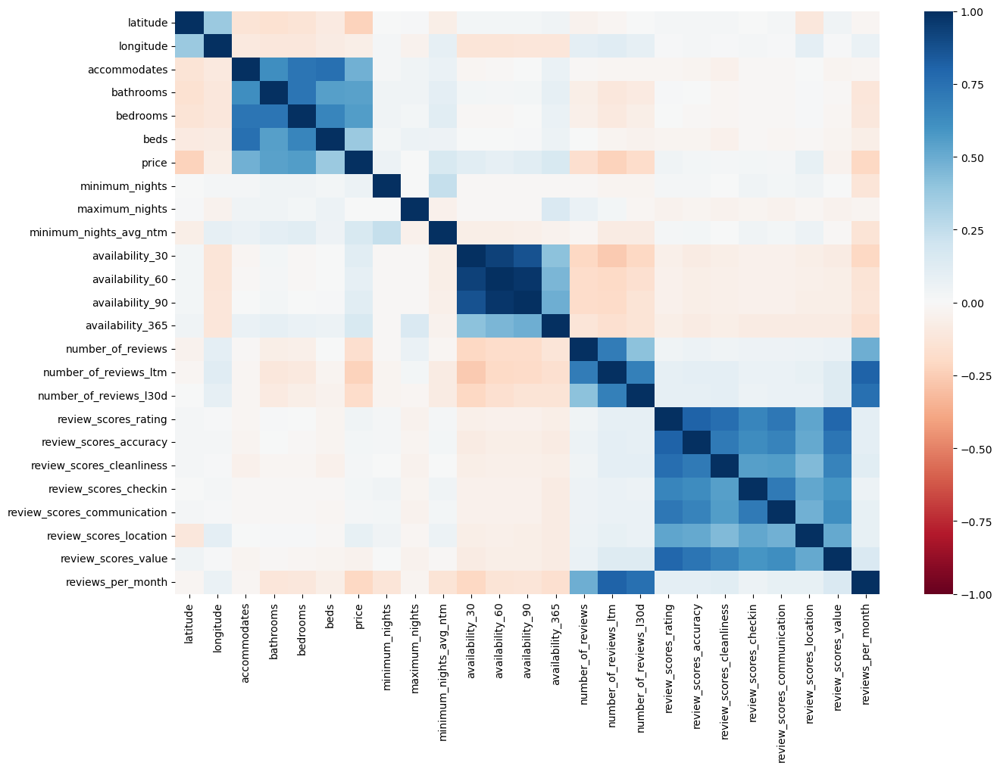

In [1862]:
plt.figure(figsize=(15,10))
correlations = df.corr(numeric_only=True)
sns.heatmap(round(correlations,2), cmap='RdBu', annot=False, 
            annot_kws={"size": 7}, vmin=-1, vmax=1);

In [1863]:
# IDEA:
# Get coordinate information to delimite a beach front area and then create another column that indicated if the property is
# at the beach or not

In [1864]:
# Number of review ltm vs price

df.corr(numeric_only = True)["price"].sort_values(ascending = False, key = abs)

price                          1.000000
bedrooms                       0.560780
bathrooms                      0.543571
accommodates                   0.479073
beds                           0.368016
latitude                      -0.233750
number_of_reviews_ltm         -0.226046
reviews_per_month             -0.207862
number_of_reviews_l30d        -0.178404
number_of_reviews             -0.167009
minimum_nights_avg_ntm         0.164817
availability_365               0.157532
availability_90                0.110074
availability_30                0.106340
availability_60                0.085429
review_scores_location         0.081291
longitude                     -0.072466
minimum_nights                 0.060200
review_scores_rating           0.040135
review_scores_value           -0.038646
review_scores_accuracy         0.026100
review_scores_checkin          0.025631
review_scores_cleanliness      0.018269
review_scores_communication    0.017121
maximum_nights                 0.000706


#### Reviews Analysis

{'whiskers': [<matplotlib.lines.Line2D at 0x10db45f3b50>,
 'caps': [<matplotlib.lines.Line2D at 0x10db4675450>,
 'boxes': [<matplotlib.lines.Line2D at 0x10db462e910>],
 'medians': [<matplotlib.lines.Line2D at 0x10db46762d0>],
 'fliers': [<matplotlib.lines.Line2D at 0x10db4676ad0>],
 'means': []}

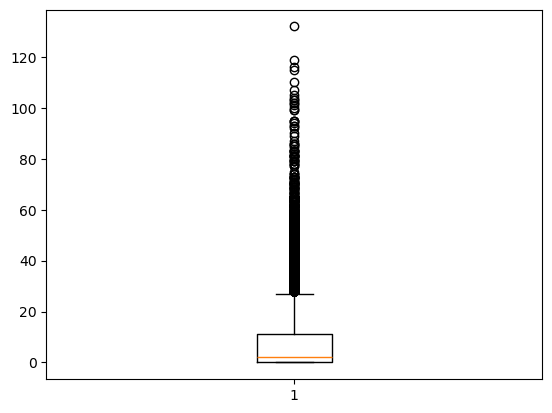

In [1866]:
plt.boxplot(df.number_of_reviews_ltm)

{'whiskers': [<matplotlib.lines.Line2D at 0x10db46bcd90>,
 'caps': [<matplotlib.lines.Line2D at 0x10db46be150>,
 'boxes': [<matplotlib.lines.Line2D at 0x10db46bc350>],
 'medians': [<matplotlib.lines.Line2D at 0x10db46bf2d0>],
 'fliers': [<matplotlib.lines.Line2D at 0x10db46bfb90>],
 'means': []}

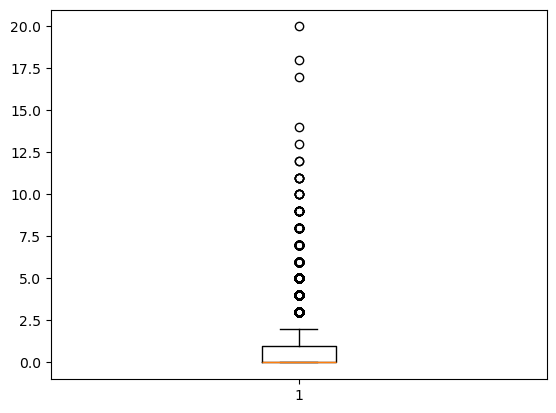

In [1867]:
plt.boxplot(df.number_of_reviews_l30d)

{'whiskers': [<matplotlib.lines.Line2D at 0x10db4653350>,
 'caps': [<matplotlib.lines.Line2D at 0x10da95c8650>,
 'boxes': [<matplotlib.lines.Line2D at 0x10db4652a10>],
 'medians': [<matplotlib.lines.Line2D at 0x10da95c9690>],
 'fliers': [<matplotlib.lines.Line2D at 0x10db46413d0>],
 'means': []}

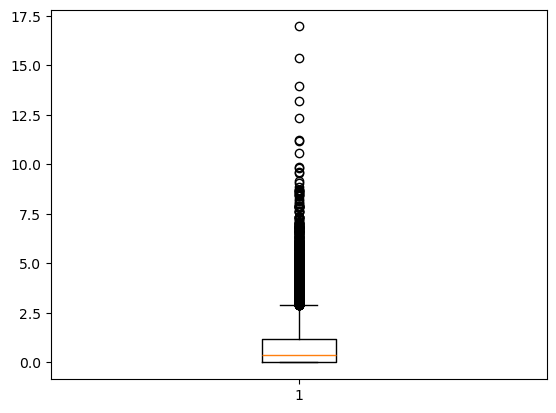

In [1868]:
df.reviews_per_month = df.reviews_per_month.fillna(0)
plt.boxplot(df.reviews_per_month)

{'whiskers': [<matplotlib.lines.Line2D at 0x10da9690b90>,
 'caps': [<matplotlib.lines.Line2D at 0x10da9691f10>,
 'boxes': [<matplotlib.lines.Line2D at 0x10da9690450>],
 'medians': [<matplotlib.lines.Line2D at 0x10da9692f90>],
 'fliers': [<matplotlib.lines.Line2D at 0x10da96937d0>],
 'means': []}

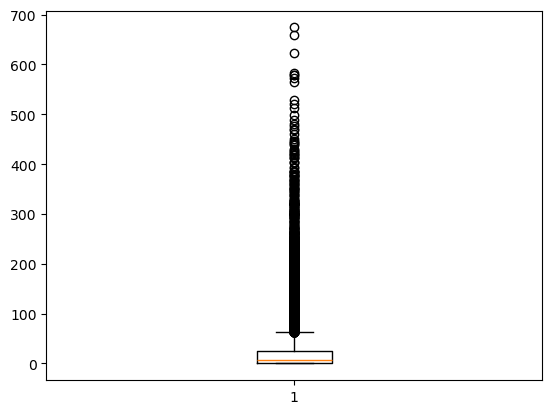

In [1869]:
plt.boxplot(df.number_of_reviews)

In [1870]:
# Capping outlier values. Will represent 100+, 4+, etc...
df.number_of_reviews = df.number_of_reviews.apply(lambda x: x if x <=100 else 100)
df.corr(numeric_only = True).price

df.number_of_reviews_l30d = df.number_of_reviews_l30d.apply(lambda x: x if x <=2.5 else 2.5)
df.corr(numeric_only = True).price

df.reviews_per_month = df.reviews_per_month.apply(lambda x: x if x <=4 else 4)
df.corr(numeric_only = True).price

df.number_of_reviews_ltm = df.number_of_reviews_ltm.apply(lambda x: x if x <=30 else 30)
df.corr(numeric_only = True).price

latitude                      -0.233750
longitude                     -0.072466
accommodates                   0.479073
bathrooms                      0.543571
bedrooms                       0.560780
beds                           0.368016
price                          1.000000
minimum_nights                 0.060200
maximum_nights                 0.000706
minimum_nights_avg_ntm         0.164817
availability_30                0.106340
availability_60                0.085429
availability_90                0.110074
availability_365               0.157532
number_of_reviews             -0.203208
number_of_reviews_ltm         -0.245668
number_of_reviews_l30d        -0.198854
review_scores_rating           0.040135
review_scores_accuracy         0.026100
review_scores_cleanliness      0.018269
review_scores_checkin          0.025631
review_scores_communication    0.017121
review_scores_location         0.081291
review_scores_value           -0.038646
reviews_per_month             -0.262712


Text(0.5, 0, 'Price')

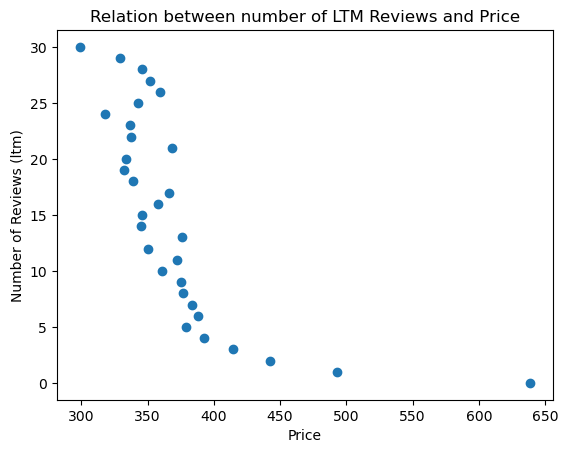

In [1871]:
# The lower the number of reviews, the higher the price
# It makes sense as lessp eople would stay in a high price property compared to a low one.

df_price_reviews = df.loc[:,["number_of_reviews_ltm", "price"]].groupby("number_of_reviews_ltm").mean().sort_values(by = "price", ascending = False)

plt.scatter(x = df_price_reviews.price, y = df_price_reviews.index)
plt.title("Relation between number of LTM Reviews and Price")
plt.ylabel("Number of Reviews (ltm)")
plt.xlabel("Price")

##### Reviews per Month

Text(0.5, 0, 'Price')

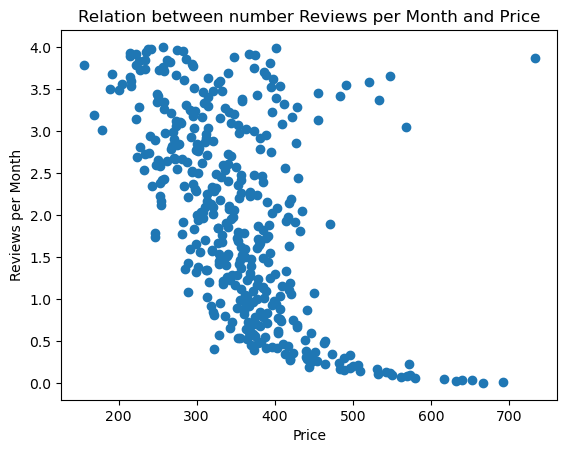

In [1873]:
df_price_reviews = df.loc[:,["reviews_per_month", "price"]].groupby("reviews_per_month").mean().sort_values(by = "price", ascending = False)

plt.scatter(x = df_price_reviews.price, y = df_price_reviews.index)
plt.title("Relation between number Reviews per Month and Price")
plt.ylabel("Reviews per Month")
plt.xlabel("Price")

##### Reviews last 30 days

Text(0.5, 0, 'Price')

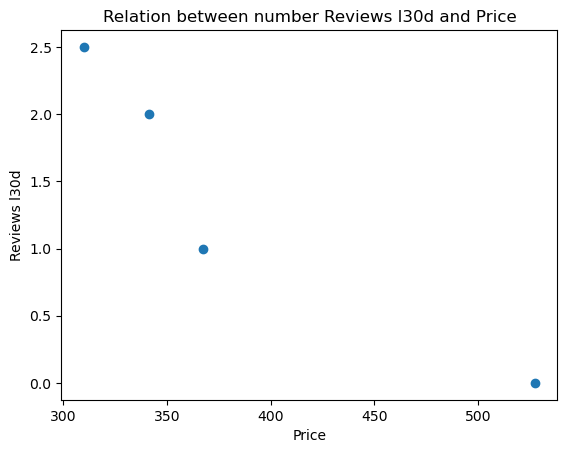

In [1875]:
df_price_reviews = df.loc[:,["number_of_reviews_l30d", "price"]].groupby("number_of_reviews_l30d").mean().sort_values(by = "price", ascending = False)

plt.scatter(x = df_price_reviews.price, y = df_price_reviews.index)
plt.title("Relation between number Reviews l30d and Price")
plt.ylabel("Reviews l30d")
plt.xlabel("Price")

##### Number of Reviews

Text(0.5, 0, 'Price')

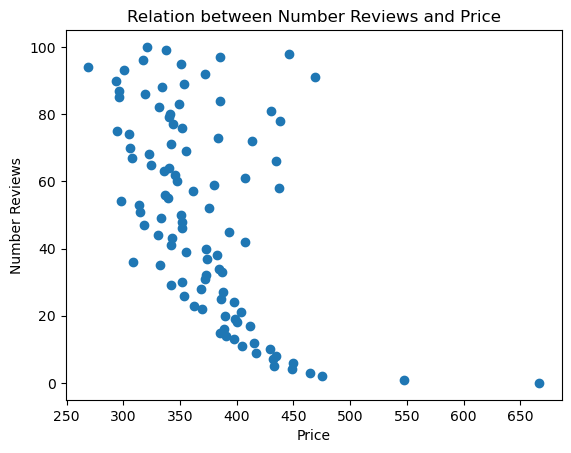

In [1877]:
df_price_reviews = df.loc[:,["number_of_reviews", "price"]].groupby("number_of_reviews").mean().sort_values(by = "price", ascending = False)

plt.scatter(x = df_price_reviews.price, y = df_price_reviews.index)
plt.title("Relation between Number Reviews and Price")
plt.ylabel("Number Reviews")
plt.xlabel("Price")

In [1878]:
# Filling missing values of Reviews per Month with 0 as the majority correspond to 0 for the LTM Reviews - which could indicate there was no review at the moment

print(df.reviews_per_month.isna().sum())

df.reviews_per_month = df.reviews_per_month.fillna(0)

0


In [1879]:
reviews_drop = ["number_of_reviews","number_of_reviews_ltm","number_of_reviews_l30d"]

df.columns
# TO REVISIT
#df = df.drop(reviews_drop, axis = 1)

Index(['host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_verifications', 'host_has_profile_pic',
       'host_identity_verified', 'neighbourhood_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_nights_avg_ntm',
       'has_availability', 'availability_30', 'availability_60',
       'availability_90', 'availability_365', 'number_of_reviews',
       'number_of_reviews_ltm', 'number_of_reviews_l30d',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'instant_bookable', 'reviews_per_month'],
      dtype='object')

In [1880]:
cols = ["minimum_nights", "maximum_nights", "price"]
df[cols]

,minimum_nights,maximum_nights,price
0,5,28,310.0
1,2,60,203.0
2,1,365,220.0
3,3,15,201.0
4,1,730,321.0
...,...,...,...
34659,2,365,673.0
34660,2,365,208.0
34661,2,15,729.0
34662,2,365,1040.0


In [1882]:
availability = ["availability_30","availability_60","availability_90","availability_365", "price"]

df[availability].corr()

,availability_30,availability_60,availability_90,availability_365,price
availability_30,1.000000,0.928542,0.867205,0.405840,0.106340
availability_60,0.928542,1.000000,0.966944,0.455663,0.085429
availability_90,0.867205,0.966944,1.000000,0.490859,0.110074
availability_365,0.405840,0.455663,0.490859,1.000000,0.157532
price,0.106340,0.085429,0.110074,0.157532,1.000000


{'whiskers': [<matplotlib.lines.Line2D at 0x10d9c738650>,
 'caps': [<matplotlib.lines.Line2D at 0x10d9c739890>,
 'boxes': [<matplotlib.lines.Line2D at 0x10d9c74e050>],
 'medians': [<matplotlib.lines.Line2D at 0x10d9c73a990>],
 'fliers': [<matplotlib.lines.Line2D at 0x10d9c73b210>],
 'means': []}

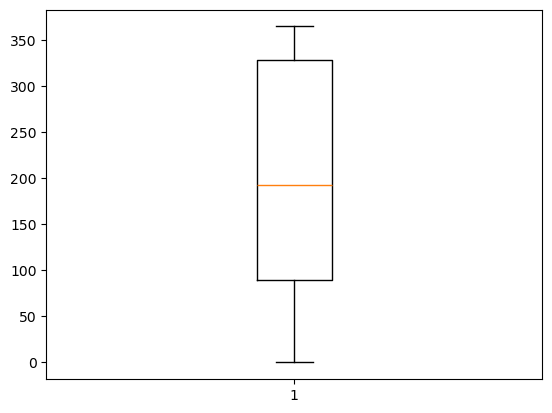

In [1883]:
plt.boxplot(df.availability_365)

{'whiskers': [<matplotlib.lines.Line2D at 0x10da5cda390>,
 'caps': [<matplotlib.lines.Line2D at 0x10da5cdb4d0>,
 'boxes': [<matplotlib.lines.Line2D at 0x10da5cd9c90>],
 'medians': [<matplotlib.lines.Line2D at 0x10da5ca8550>],
 'fliers': [<matplotlib.lines.Line2D at 0x10da5ca8e50>],
 'means': []}

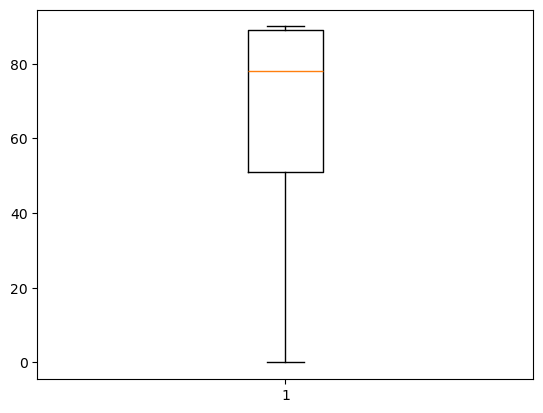

In [1884]:
plt.boxplot(df.availability_90)

{'whiskers': [<matplotlib.lines.Line2D at 0x10da5cb3e90>,
 'caps': [<matplotlib.lines.Line2D at 0x10da5c311d0>,
 'boxes': [<matplotlib.lines.Line2D at 0x10da5cb35d0>],
 'medians': [<matplotlib.lines.Line2D at 0x10da5c322d0>],
 'fliers': [<matplotlib.lines.Line2D at 0x10da5c329d0>],
 'means': []}

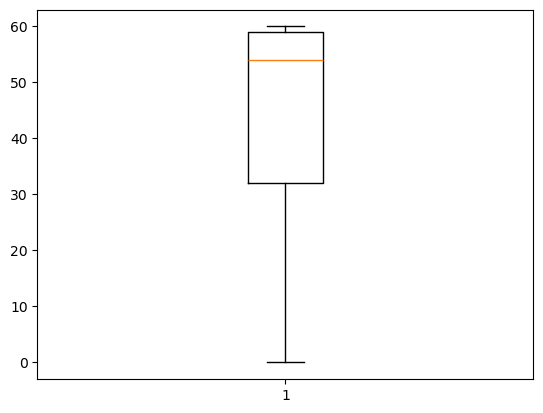

In [1885]:
plt.boxplot(df.availability_60)

{'whiskers': [<matplotlib.lines.Line2D at 0x10da5cfe150>,
 'caps': [<matplotlib.lines.Line2D at 0x10da5cff890>,
 'boxes': [<matplotlib.lines.Line2D at 0x10da5cfd710>],
 'medians': [<matplotlib.lines.Line2D at 0x10d87de8e50>],
 'fliers': [<matplotlib.lines.Line2D at 0x10d87de9890>],
 'means': []}

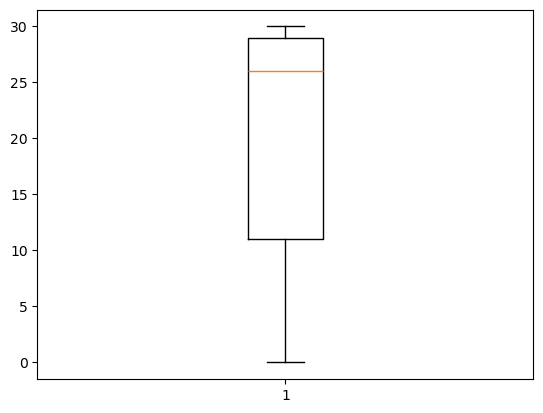

In [1886]:
plt.boxplot(df.availability_30)

In [1887]:
# Dropping features not relevant: 


# availability_365
# host_is_superhost
# minimum_nights
# has_availability

drop_feat = [
            "minimum_nights", 
             "maximum_nights", 
             #"availability_365",
             #"availability_30", 
             #"availability_60", 
             #"availability_90",
            ]

df = df.drop(drop_feat, axis = 1)

#### Score

In [1889]:
score_features = ["review_scores_value", "review_scores_accuracy", "review_scores_rating", "review_scores_checkin", "review_scores_cleanliness", "review_scores_communication", "review_scores_location", "price"]
df.loc[:,score_features].corr()

,review_scores_value,review_scores_accuracy,review_scores_rating,review_scores_checkin,review_scores_cleanliness,review_scores_communication,review_scores_location,price
review_scores_value,1.000000,0.734686,0.791157,0.586377,0.673304,0.616341,0.506517,-0.038646
review_scores_accuracy,0.734686,1.000000,0.813421,0.627485,0.707499,0.673746,0.510843,0.026100
review_scores_rating,0.791157,0.813421,1.000000,0.664094,0.764993,0.718979,0.528282,0.040135
review_scores_checkin,0.586377,0.627485,0.664094,1.000000,0.549733,0.707721,0.515464,0.025631
review_scores_cleanliness,0.673304,0.707499,0.764993,0.549733,1.000000,0.557945,0.436113,0.018269
review_scores_communication,0.616341,0.673746,0.718979,0.707721,0.557945,1.000000,0.478843,0.017121
review_scores_location,0.506517,0.510843,0.528282,0.515464,0.436113,0.478843,1.000000,0.081291
price,-0.038646,0.026100,0.040135,0.025631,0.018269,0.017121,0.081291,1.000000


In [1890]:
df[score_features].isna().sum()

review_scores_value            6488
review_scores_accuracy         6486
review_scores_rating           6477
review_scores_checkin          6486
review_scores_cleanliness      6485
review_scores_communication    6486
review_scores_location         6486
price                             0
dtype: int64

In [1952]:
df.corr(numeric_only = True).price

def replace_na_score(criteria):
    df["is_score_"+ criteria + "_empty"] = df["review_scores_"+ criteria].isna()*1
    df["review_scores_"+ criteria] = df["review_scores_"+ criteria].fillna(3)

replace_na_score("location")
#replace_na_score("rating")


df[["is_score_location_empty", "review_scores_location"]]
#df[["is_score_rating_empty", "review_scores_rating"]]

,is_score_location_empty,review_scores_location
0,0,4.77
1,0,4.84
2,0,4.80
3,0,4.94
4,0,4.97
...,...,...
34659,1,3.00
34660,1,3.00
34661,1,3.00
34662,1,3.00


In [1954]:
# Dropping reviews score. Low correlation

# review_scores_value
# review_scores_rating
# review_scores_accuracy
# review_scores_checkin
# review_scores_cleanliness
# review_scores_communication
# review_scores_location 

#  "review_scores_rating"

drop_reviews = [
                "review_scores_value", 
                "review_scores_accuracy", 
                "review_scores_rating",
                "review_scores_checkin", 
                "review_scores_cleanliness",
                "review_scores_communication",
                #"review_scores_location",
]

df = df.drop(drop_reviews, axis = 1)

In [1955]:
df.corr(numeric_only = True).price

latitude                  -0.233750
longitude                 -0.072466
accommodates               0.479073
bathrooms                  0.543571
bedrooms                   0.560780
beds                       0.368016
price                      1.000000
minimum_nights_avg_ntm     0.164817
availability_30            0.106340
availability_60            0.085429
availability_90            0.110074
availability_365           0.157532
number_of_reviews         -0.203208
number_of_reviews_ltm     -0.245668
number_of_reviews_l30d    -0.198854
review_scores_location    -0.230391
reviews_per_month         -0.262712
is_score_location_empty    0.262828
Name: price, dtype: float64

In [1956]:
print(df.isna().sum())

#df = df.dropna()

host_response_time         4747
host_response_rate         4747
host_acceptance_rate       2782
host_is_superhost           730
host_verifications            0
host_has_profile_pic          0
host_identity_verified        0
neighbourhood_cleansed        0
latitude                      0
longitude                     0
property_type                 0
room_type                     0
accommodates                  0
bathrooms                     0
bathrooms_text               33
bedrooms                      0
beds                          0
amenities                     0
price                         0
minimum_nights_avg_ntm        0
has_availability            229
availability_30               0
availability_60               0
availability_90               0
availability_365              0
number_of_reviews             0
number_of_reviews_ltm         0
number_of_reviews_l30d        0
review_scores_location        0
instant_bookable              0
reviews_per_month             0
is_score

### Categorical Data

In [1958]:
# instant_bookable - low correlation
# has_availability - same value for all/majority
low_corr = ["has_availability", "instant_bookable"]

df = df.drop(low_corr, axis = 1)

Text(0.5, 1.0, 'Acceptance rate X Price')

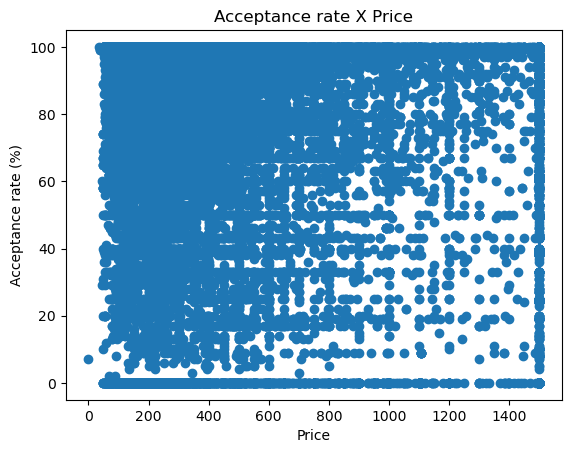

In [1959]:
#We can see from the chart below that the response rate does not influence the price, as we have low and high prices with 100% repsonse rate for example

df.host_acceptance_rate = df.host_acceptance_rate.apply(lambda x : float(x.split("%")[0]) if isinstance(x, str) else x)
plt.scatter(x = df.price, y = df.host_acceptance_rate)
plt.ylabel("Acceptance rate (%)")
plt.xlabel("Price")
plt.title("Acceptance rate X Price")

Text(0.5, 1.0, 'Response rate X Price')

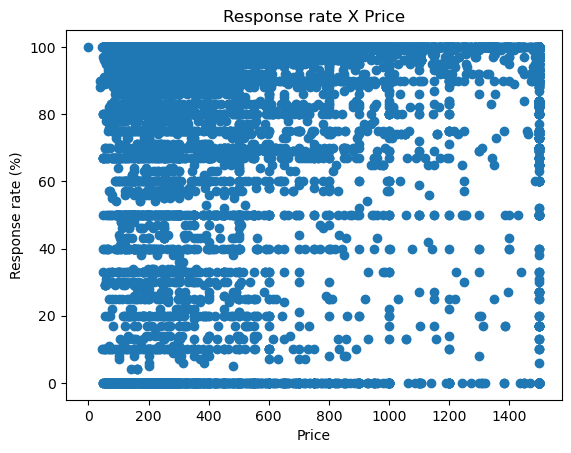

In [1960]:
# Same results for response rate

df.host_response_rate = df.host_response_rate.apply(lambda x : float(x.split("%")[0]) if isinstance(x, str) else x)
plt.scatter(x = df.price, y = df.host_response_rate)
plt.ylabel("Response rate (%)")
plt.xlabel("Price")
plt.title("Response rate X Price")

In [1961]:
# Host Super Host
# No apparent real correlation: superhost has an average lower price.
# Also, superhost are a minority.

print(df.groupby("host_is_superhost").mean(numeric_only = True).price)
print(df.host_is_superhost.value_counts())

host_is_superhost
f    505.114586
t    406.198601
Name: price, dtype: float64
host_is_superhost
f    19217
t     8862
Name: count, dtype: int64


In [1962]:
# Drop Response/Acceptance rate
df = df.drop(["host_response_rate", "host_acceptance_rate", "host_is_superhost"], axis = 1)

In [1963]:
# Removing low correlations 
low_corr = ["host_has_profile_pic", "host_identity_verified"]
df = df.drop(low_corr, axis = 1)

### Dealing with Nans

In [1965]:
df.isna().sum()

host_response_time         4747
host_verifications            0
neighbourhood_cleansed        0
latitude                      0
longitude                     0
property_type                 0
room_type                     0
accommodates                  0
bathrooms                     0
bathrooms_text               33
bedrooms                      0
beds                          0
amenities                     0
price                         0
minimum_nights_avg_ntm        0
availability_30               0
availability_60               0
availability_90               0
availability_365              0
number_of_reviews             0
number_of_reviews_ltm         0
number_of_reviews_l30d        0
review_scores_location        0
reviews_per_month             0
is_score_location_empty       0
dtype: int64

In [1966]:
# host_response_time

df.isna().sum()

le = LabelEncoder()

copy_df = pd.DataFrame()
copy_df["host_response_time"] = le.fit_transform(df.host_response_time)
copy_df["price"] = df.price

#host_response_time does not correlate to the price
# We solve the Nan problem as well
print(copy_df.corr())

df = df.drop("host_response_time", axis = 1)

                    host_response_time    price
host_response_time             1.00000  0.00147
price                          0.00147  1.00000


In [1967]:
# bathrooms - contains the same information about the number of bathrooms as bathrooms_text
# bathrooms_text - keeping this feature for later extraction of private/shared bathroom information. It will be dropped later

df = df.dropna(subset = "bathrooms")

In [1968]:
# bedrooms - cannot impute the value based on the dataset. So dropping all these nas
# beds - same reason for beds

df = df.dropna(subset = ["bedrooms", "beds"])

### Property Type

In [1970]:
# property_type: info  already capture with is_entire_property
# host_verifications: majority of values are the same

df = df.drop(["property_type", "host_verifications"], axis = 1)
#df = df.drop(["host_verifications"], axis = 1)

In [1971]:
df.isna().sum()

neighbourhood_cleansed      0
latitude                    0
longitude                   0
room_type                   0
accommodates                0
bathrooms                   0
bathrooms_text             33
bedrooms                    0
beds                        0
amenities                   0
price                       0
minimum_nights_avg_ntm      0
availability_30             0
availability_60             0
availability_90             0
availability_365            0
number_of_reviews           0
number_of_reviews_ltm       0
number_of_reviews_l30d      0
review_scores_location      0
reviews_per_month           0
is_score_location_empty     0
dtype: int64

### Encoding room_type

In [1973]:
df.groupby("room_type").mean(numeric_only = True)[["price"]]

,price
room_type,
Entire home/apt,525.327293
Hotel room,429.590909
Private room,292.185133
Shared room,200.770795


In [1974]:
print(df.room_type.value_counts())

room_type
Entire home/apt    22515
Private room        5731
Shared room          541
Hotel room            22
Name: count, dtype: int64


In [1975]:
print(df.room_type.value_counts())

#Remove Hotel Rooms and Shared Roms (outliers)
#df = df.loc[(df.room_type != "Hotel room"),:]
df = df.loc[(df.room_type != "Hotel room") &
            (df.room_type != "Shared room"), :]

#df.room_type = df.room_type.apply(lambda x : "Private Room" if x == "Shared Room" else x )

# Label Encode room_type category (binary value 0/1)
le = LabelEncoder()
df["is_entire_home"] = le.fit_transform(df["room_type"])
df["is_entire_home"] = df["is_entire_home"].apply(lambda x : 1 - x)

df = df.drop("room_type", axis = 1)

room_type
Entire home/apt    22515
Private room        5731
Shared room          541
Hotel room            22
Name: count, dtype: int64


### Extracting private/share bathroom information

In [1977]:
df.bathrooms_text.unique()

# Create columns with shared bath boolean and another with number of bathrooms

    
def bathroom_number(a_bath):

    number_bath = 0 #default value
    is_shared = 0 #default value
    
    # Handling missing values
    if(pd.isna(a_bath)):

        number_bath = np.nan
        is_shared = np.nan
    else:

        #Split the bathroom string
        bath_split = a_bath.split()    

        try:
            #Case has-a-number
            number_bath = float(bath_split[0])   #If element not a number it will execute the exception code

           
            #Case has-a-number + shared
            if(re.match(".*shared.*", str.lower(a_bath))):
                is_shared = 1

        except:
            #Case dont-have-number
            if(re.match(".*half-bath.*", str.lower(a_bath))):
                number_bath = 0.5
            #Case dont-have-number + shared
            if(re.match(".*shared.*", str.lower(a_bath))):
                is_shared = 1  
          
 
    return number_bath, is_shared
            
    

df[["number_bathroom", "is_bathroom_shared"]] = df["bathrooms_text"].apply(lambda x: pd.Series(bathroom_number(x)))

# Dropping original feature wwith number and shared info
df = df.drop(["bathrooms_text", "number_bathroom"], axis = 1)

## !! number_bathroom is reduntant since this info is already in the "bathroom" feature

In [1978]:
# Recover this information from is_entire_home.
# If the apartment is private (all for the renter) then the toilet is ASSUMED to be private too
df.loc[df["is_bathroom_shared"].isna(), "is_bathroom_shared"] = df.loc[df["is_bathroom_shared"].isna(), "is_entire_home"].apply(lambda x: abs(x-1))

In [1979]:
df.isna().sum()

neighbourhood_cleansed     0
latitude                   0
longitude                  0
accommodates               0
bathrooms                  0
bedrooms                   0
beds                       0
amenities                  0
price                      0
minimum_nights_avg_ntm     0
availability_30            0
availability_60            0
availability_90            0
availability_365           0
number_of_reviews          0
number_of_reviews_ltm      0
number_of_reviews_l30d     0
review_scores_location     0
reviews_per_month          0
is_score_location_empty    0
is_entire_home             0
is_bathroom_shared         0
dtype: int64

#Option 1: With seabron
sns.pairplot( data = df)
#Option 2
#mtrx = pd.plotting.scatter_matrix(df)

#### Expensive property analysis

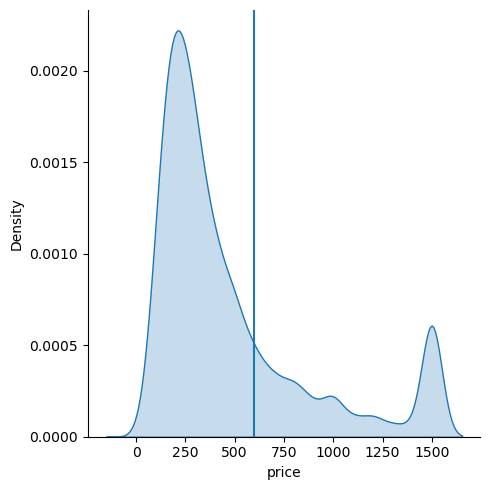

In [1982]:
sns.displot(df, x = "price", kind = "kde", fill = "True")
plt.axvline(600)

In [1983]:
df_rich = df.loc[df.price > 600, :]

### Extracting amenities information

In [1985]:
features = set()

features_dict = {}

features_dict_poor = {}

# Convert the amenities string into a list of amenities
def add_amenities_to_set(amenities):
    amenities_proc = amenities.replace("[", "").replace("]", "").replace('"', "")
    amenitites_splitted = amenities_proc.split(", ")
    features.update(amenitites_splitted)
    
    for amn in amenitites_splitted:
        if amn in features_dict:
            features_dict.update({amn : features_dict[amn] + 1})
        else:
            features_dict.update({amn : 1})
            
def add_amenities_to_set2(amenities):
    amenities_proc = amenities.replace("[", "").replace("]", "").replace('"', "")
    amenitites_splitted = amenities_proc.split(", ")
    features.update(amenitites_splitted)
    
    for amn in amenitites_splitted:
        if amn in features_dict_poor:
            features_dict_poor.update({amn : features_dict_poor[amn] + 1})
        else:
            features_dict_poor.update({amn : 1})

#Check what kind of features the properties with price higher than 80% of the PRICE_CAP
#df_rich = df.loc[df.price >= PRICE_CAP*0.8, :]    
df_rich = df.loc[df.price >= 600, :]    
df_poor = df.loc[df.price < 600, :]    
    
df_rich.amenities.apply(lambda x: add_amenities_to_set(x))
df_poor.amenities.apply(lambda x: add_amenities_to_set2(x))

print(len(features))
features

df_amn_count_rich = pd.DataFrame.from_dict(features_dict, orient='index', columns = ["rich count"])
df_amn_count_rich = df_amn_count_rich.sort_values(by = "rich count", ascending = False)

df_amn_count_poor = pd.DataFrame.from_dict(features_dict_poor, orient='index', columns = ["poor count"])
df_amn_count_poor= df_amn_count_poor.sort_values(by = "poor count", ascending = False)

#features_dict

4552


In [1986]:
print(df_amn_count_rich.shape)
print(df_amn_count_poor.shape)

(1813, 1)
(3908, 1)


In [1987]:
print(df.loc[df.price >= 600, :].shape)    
print(df.loc[df.price < 600, :].shape)   

(7058, 22)
(21188, 22)


In [1988]:
# This Data Frame shows the % of the presence of the amenities for the expensive properties and the cheap properties.
# The diff column shows the difference between these percentages. The goal was to identify the cases where the presence of the amenitiy was higher for
# the expensive properties.

process = df_amn_count_rich.merge(df_amn_count_poor, how="outer", left_index = True, right_index = True).sort_values(by="rich count", ascending = False)


process["rich count"] = (process["rich count"]*100)/(df.loc[df.price >= 600, :].shape[0]) 
process["poor count"] = (process["poor count"]*100)/(df.loc[df.price < 600, :].shape[0]) 
process["diff"] = process["rich count"] - process["poor count"]

process.sort_values(by = "diff", ascending = True).head(30)

,rich count,poor count,diff
Bed linens,50.070842,65.442703,-15.371862
Dishes and silverware,57.820912,71.658486,-13.837573
Hot water,57.126665,70.388899,-13.262235
Lock on bedroom door,3.584585,15.843874,-12.259289
Laundromat nearby,19.467271,31.045875,-11.578604
Long term stays allowed,28.790026,39.923542,-11.133516
Room-darkening shades,33.578918,44.520483,-10.941566
Ceiling fan,14.465854,25.349254,-10.883400
Self check-in,23.448569,33.962620,-10.514051
Clothing storage: wardrobe,15.797676,25.825939,-10.028263


In [1989]:


######################################################
#List of amenities being considered (TO BE REVISED !)#
######################################################
amenities_list_re = { "parking": ".*parking on premises.*", 
                     "pool":".*pool.*(?!.*\btable\b).*", 
                     "pool_table": ".*pool table.*",
                     "ac1": ".*air conditioning.*",
                     "ac2":".* ac .*",
                     "washer": ".*washer.*",
                     "bathtub1": ".*bathtub.*",
                     "bathtub2": ".*hot tub.*",
                     "beach_view1": ".*beach view.*",
                     "beach_view2": ".*sea view.*",
                     "beach_view3": ".*ocean view.*",
                     "beach_access1": ".*waterfront*",
                     "beach_access2": ".*beach access*",
                     "sauna": ".*sauna.*",
                     "gym" : ".*gym.*",
                     "piano": ".*piano.*",
                     "dishwasher": ".*dishwasher.*",
                     "dryer": ".*dryer.*",
                     "ceiling_fan" : ".*ceiling fan.*",
                     "long_term" : ".*long term.*",
                     "bbq_grill" : ".*bbq grill.*",
                     "self_checkin" : ".*self check-in.*",
                      }
        
    
#Create the has_amenities columns
has_amn_feat = ["has_" + x for x in amenities_list_re.keys()]

#Default value 0 (does not have amenity)
df[has_amn_feat] = 0


def convert_amenities(amenities, index): 
    for amn_name, amn_re in amenities_list_re.items():
        if(re.match(amn_re, str.lower(amenities))):
  
            df.loc[index,"has_"+ amn_name] = 1

for index, row in df.iterrows():
    convert_amenities(df.loc[index, "amenities"], index)

# Merge features
df["has_ac"] = df.apply(lambda x: (x["has_ac1"] or x["has_ac2"]), axis = 1)
df["has_bathtub"] = df.apply(lambda x: (x["has_bathtub1"] or x["has_bathtub2"]), axis = 1)
df["has_seaview"] = df.apply(lambda x: (x["has_beach_view1"] or x["has_beach_view2"] or x["has_beach_view3"]), axis = 1)
df["has_beach_access"] = df.apply(lambda x: (x["has_beach_access1"] or x["has_beach_access2"]), axis = 1)

# Drop aac1 and ac2 and amenities features
df = df.drop(["has_ac1", "has_ac2","has_bathtub1","has_bathtub2","has_beach_view1","has_beach_view2", "has_beach_view3",
              "amenities", "has_beach_access1", "has_beach_access2"], axis = 1)

#df = df.drop(["has_ac1", "has_ac2","has_bathtub1","has_bathtub2","has_beach_view1","has_beach_view2", "has_beach_view3"], axis = 1)

In [1990]:
df_categorical = df.select_dtypes(include = 'object')
df_categorical

,neighbourhood_cleansed
0,Copacabana
1,Copacabana
2,Tijuca
3,Copacabana
4,Ipanema
...,...
34659,Copacabana
34660,Botafogo
34661,Leblon
34662,Copacabana


In [1991]:
# Confirming the absence of missing values
df.isna().sum()

neighbourhood_cleansed     0
latitude                   0
longitude                  0
accommodates               0
bathrooms                  0
bedrooms                   0
beds                       0
price                      0
minimum_nights_avg_ntm     0
availability_30            0
availability_60            0
availability_90            0
availability_365           0
number_of_reviews          0
number_of_reviews_ltm      0
number_of_reviews_l30d     0
review_scores_location     0
reviews_per_month          0
is_score_location_empty    0
is_entire_home             0
is_bathroom_shared         0
has_parking                0
has_pool                   0
has_pool_table             0
has_washer                 0
has_sauna                  0
has_gym                    0
has_piano                  0
has_dishwasher             0
has_dryer                  0
has_ceiling_fan            0
has_long_term              0
has_bbq_grill              0
has_self_checkin           0
has_ac        

In [1992]:
df.columns

Index(['neighbourhood_cleansed', 'latitude', 'longitude', 'accommodates',
       'bathrooms', 'bedrooms', 'beds', 'price', 'minimum_nights_avg_ntm',
       'availability_30', 'availability_60', 'availability_90',
       'availability_365', 'number_of_reviews', 'number_of_reviews_ltm',
       'number_of_reviews_l30d', 'review_scores_location', 'reviews_per_month',
       'is_score_location_empty', 'is_entire_home', 'is_bathroom_shared',
       'has_parking', 'has_pool', 'has_pool_table', 'has_washer', 'has_sauna',
       'has_gym', 'has_piano', 'has_dishwasher', 'has_dryer',
       'has_ceiling_fan', 'has_long_term', 'has_bbq_grill', 'has_self_checkin',
       'has_ac', 'has_bathtub', 'has_seaview', 'has_beach_access'],
      dtype='object')

In [1993]:
df.is_entire_home.value_counts()

is_entire_home
1    22515
0     5731
Name: count, dtype: int64

<Axes: xlabel='accommodates', ylabel='price'>

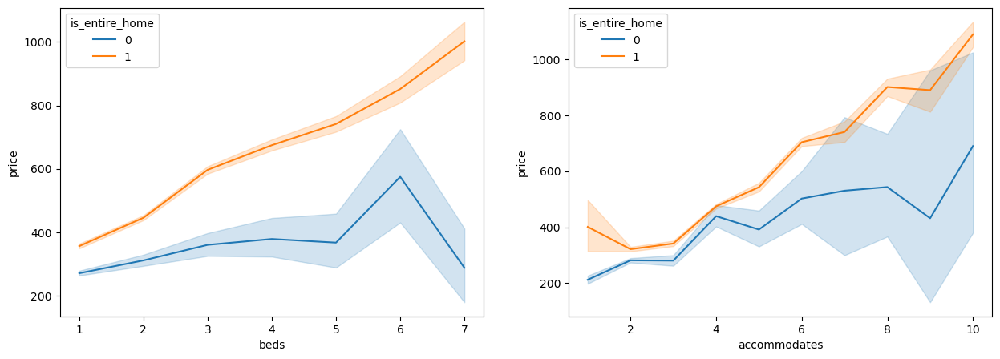

In [1994]:
fig, ax = plt.subplots(1,2, figsize=(15,5))

# Min 1 bed and max 7 beds
sns.lineplot(ax =ax[0] , data = df.loc[(df.beds <=7) & (df.beds > 0),:], x="beds", y="price", hue = "is_entire_home")

# Min 1 ppl and max 10 ppl
sns.lineplot(ax = ax[1], data = df.loc[(df.accommodates <=10) & (df.accommodates > 0),:], x="accommodates", y="price", hue = "is_entire_home")

## Clustering with geolocation

In [1996]:
df.columns

Index(['neighbourhood_cleansed', 'latitude', 'longitude', 'accommodates',
       'bathrooms', 'bedrooms', 'beds', 'price', 'minimum_nights_avg_ntm',
       'availability_30', 'availability_60', 'availability_90',
       'availability_365', 'number_of_reviews', 'number_of_reviews_ltm',
       'number_of_reviews_l30d', 'review_scores_location', 'reviews_per_month',
       'is_score_location_empty', 'is_entire_home', 'is_bathroom_shared',
       'has_parking', 'has_pool', 'has_pool_table', 'has_washer', 'has_sauna',
       'has_gym', 'has_piano', 'has_dishwasher', 'has_dryer',
       'has_ceiling_fan', 'has_long_term', 'has_bbq_grill', 'has_self_checkin',
       'has_ac', 'has_bathtub', 'has_seaview', 'has_beach_access'],
      dtype='object')

In [1997]:
from sklearn.cluster import KMeans

In [1998]:
# Initialize the model
k_means = KMeans(
    init = "random",
    n_clusters = 25,
    n_init = 10,
    max_iter = 500,
    random_state = 69
)


#Prepare the data
#df_kmeans = df.loc[:,["latitude", "longitude", "has_beach_access"]]
df_kmeans = df.loc[:,["latitude", "longitude"]]

# Fitting
k_means.fit(df_kmeans)

#Clusters as a feature
df_kmeans['cluster'] = k_means.labels_ 
df_kmeans['price'] = df.price


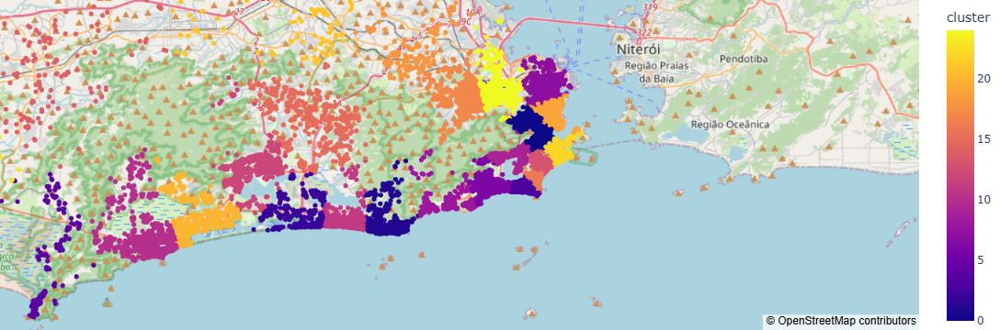

In [1999]:
fig = px.scatter_mapbox(df_kmeans, 
                  lat="latitude", 
                  lon="longitude",     
                  color="cluster",
                  hover_name = "price", 
                  size_max=15, 
                  zoom=10,
                  height = 700,
                  mapbox_style = "open-street-map")


fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
#fig.update_layout(mapbox_style="open-street-map")

In [2000]:
# Create afeature with the average price for different zones (not necessarily the same division as the neighbourhood)
df['cluster_zone_beach_access'] = df_kmeans['cluster']

In [2001]:
# Dropping latitude and longitude
# Info alaready capture with the division into different neighbourhoods
df = df.drop(["longitude", "latitude"], axis = 1)

In [2002]:
df.corr(numeric_only = True).price.sort_values(ascending = False)

price                        1.000000
bedrooms                     0.568576
bathrooms                    0.560918
accommodates                 0.498969
beds                         0.402741
is_score_location_empty      0.269773
has_pool                     0.240670
has_parking                  0.237055
is_entire_home               0.236166
has_bathtub                  0.205053
has_washer                   0.174737
availability_365             0.163815
minimum_nights_avg_ntm       0.158250
has_dishwasher               0.154134
has_bbq_grill                0.141621
has_ac                       0.126137
availability_90              0.119479
availability_30              0.117381
has_seaview                  0.109971
availability_60              0.094961
has_gym                      0.071916
has_pool_table               0.046366
has_sauna                    0.031712
has_dryer                    0.027852
has_piano                    0.013428
has_beach_access            -0.001325
has_self_che

In [2003]:
# Low amenities correlation
#last_drop = ["has_pool", "has_ac","cluster_zone_beach_access" , "has_sauna", "has_piano", "has_beach_access", "has_pool_table", "has_dryer", "has_long_term"]
last_drop = ["has_sauna", "has_piano", "has_beach_access", "has_pool_table", "has_dryer", "has_gym"]

df = df.drop(last_drop, axis = 1)

In [2004]:
df.head()

,neighbourhood_cleansed,accommodates,bathrooms,bedrooms,beds,price,minimum_nights_avg_ntm,availability_30,availability_60,availability_90,...,has_washer,has_dishwasher,has_ceiling_fan,has_long_term,has_bbq_grill,has_self_checkin,has_ac,has_bathtub,has_seaview,cluster_zone_beach_access
0,Copacabana,5,1.0,2.0,2.0,310.0,5.0,6,32,51,...,0,0,0,0,0,1,1,1,0,22
1,Copacabana,3,1.0,1.0,2.0,203.0,2.0,24,54,71,...,0,0,1,0,0,1,1,0,0,16
2,Tijuca,2,1.0,1.0,1.0,220.0,1.0,9,29,41,...,1,1,1,1,0,0,1,0,0,17
3,Copacabana,2,1.5,1.0,1.0,201.0,3.0,5,10,24,...,0,0,0,0,0,1,1,0,1,16
4,Ipanema,2,1.0,1.0,1.0,321.0,5.4,13,43,73,...,1,0,1,1,0,1,1,0,0,3


In [2005]:
#df = df.drop("cluster_zone_beach_access", axis = 1)
df = df.drop("neighbourhood_cleansed", axis = 1)

### Binary Encoding option

In [2007]:
import category_encoders as ce
#bin_encoder = ce.BinaryEncoder(cols = ['neighbourhood_cleansed'] , return_df = True)
bin_encoder = ce.BinaryEncoder(cols = ['cluster_zone_beach_access'] , return_df = True)
#bin_encoder = ce.BinaryEncoder(cols = ['neighbourhood_cleansed', 'cluster_zone_beach_access'] , return_df = True)
#bin_encoder = ce.BinaryEncoder(cols = ['neighbourhood_cleansed', 'cluster_zone_beach_access', 'property_type'] , return_df = True)

df_bin = bin_encoder.fit_transform(df.drop("price", axis = 1))

### Label Encoding

In [2009]:
from sklearn import preprocessing 

label_encoder = preprocessing.LabelEncoder() 

df_label = df.drop("price", axis = 1).copy(deep = True)
#df_label["neighbourhood_cleansed"] = label_encoder.fit_transform(df_label["neighbourhood_cleansed"])
df_label["cluster_zone_beach_access"] = label_encoder.fit_transform(df_label["cluster_zone_beach_access"])
#df_label["property_type"] = label_encoder.fit_transform(df_label["property_type"])

### One-Hod-Encoding option

In [2011]:
## Another option could be with get_dummies
from sklearn.preprocessing import OneHotEncoder

onehot_encoder_neighbourhood = OneHotEncoder(sparse_output = False)
onehot_encoder_cluster = OneHotEncoder(sparse_output = False, feature_name_combiner='concat')
#onehot_encoder_property = OneHotEncoder(sparse_output = False)

#series_onehot = onehot_encoder_neighbourhood.fit_transform(df[["neighbourhood_cleansed"]])

series_cluster_onehot = onehot_encoder_cluster.fit_transform(df[["cluster_zone_beach_access"]])

#series_property_onehot = onehot_encoder_property.fit_transform(df[["property_type"]])

In [2012]:
df_onehot = df.drop("price", axis = 1).copy(deep = True)

#df_onehot[onehot_encoder_neighbourhood.categories_[0]] = series_onehot
#df_onehot = df_onehot.drop("neighbourhood_cleansed", axis = 1)

df_onehot[onehot_encoder_cluster.categories_[0]] = series_cluster_onehot
df_onehot = df_onehot.drop("cluster_zone_beach_access", axis = 1)

#df_onehot[onehot_encoder_property.categories_[0]] = series_property_onehot
#df_onehot = df_onehot.drop("property_type", axis = 1)

In [2013]:

#Make sure all the features NAME are of type string to avoid error in the normalisation step bellow where it was
# raising an exception for different types for the feature name
df_onehot.columns = [x if isinstance(x, str) else str(x) for x in df_onehot.columns]

df_onehot.columns

Index(['accommodates', 'bathrooms', 'bedrooms', 'beds',
       'minimum_nights_avg_ntm', 'availability_30', 'availability_60',
       'availability_90', 'availability_365', 'number_of_reviews',
       'number_of_reviews_ltm', 'number_of_reviews_l30d',
       'review_scores_location', 'reviews_per_month',
       'is_score_location_empty', 'is_entire_home', 'is_bathroom_shared',
       'has_parking', 'has_pool', 'has_washer', 'has_dishwasher',
       'has_ceiling_fan', 'has_long_term', 'has_bbq_grill', 'has_self_checkin',
       'has_ac', 'has_bathtub', 'has_seaview', '0', '1', '2', '3', '4', '5',
       '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17',
       '18', '19', '20', '21', '22', '23', '24'],
      dtype='object')

In [2014]:
df_onehot["price"] = df["price"]

## Normalisation

In [2016]:
from sklearn.preprocessing import MinMaxScaler

# Normalise all the 3 types of encoding dataset above
scaler = MinMaxScaler()
df_bin = pd.DataFrame(scaler.fit_transform(df_bin), columns= df_bin.columns, index = df_bin.index)
df_label = pd.DataFrame(scaler.fit_transform(df_label), columns= df_label.columns, index = df_label.index)
df_onehot = pd.DataFrame(scaler.fit_transform(df_onehot), columns= df_onehot.columns, index = df_onehot.index)

df_bin["price"] = df["price"]
df_label["price"] = df["price"]
df_onehot["price"] = df["price"]


### Save all the datasets

In [2018]:
df_bin.to_csv("../data/df_bin.csv")
df_label.to_csv("../data/df_label.csv")
df_onehot.to_csv("../data/df_onehot.csv")

In [2019]:
#################
# TO BE REVISED #
#################

#Check the "review" features that were dropped before

In [2020]:
df.shape

(28246, 30)

In [2021]:
df.corr(numeric_only = True).price

accommodates                 0.498969
bathrooms                    0.560918
bedrooms                     0.568576
beds                         0.402741
price                        1.000000
minimum_nights_avg_ntm       0.158250
availability_30              0.117381
availability_60              0.094961
availability_90              0.119479
availability_365             0.163815
number_of_reviews           -0.211367
number_of_reviews_ltm       -0.254916
number_of_reviews_l30d      -0.207339
review_scores_location      -0.238873
reviews_per_month           -0.272423
is_score_location_empty      0.269773
is_entire_home               0.236166
is_bathroom_shared          -0.163830
has_parking                  0.237055
has_pool                     0.240670
has_washer                   0.174737
has_dishwasher               0.154134
has_ceiling_fan             -0.119368
has_long_term               -0.109557
has_bbq_grill                0.141621
has_self_checkin            -0.099568
has_ac      

In [2022]:
df_onehot.corr()

,accommodates,bathrooms,bedrooms,beds,minimum_nights_avg_ntm,availability_30,availability_60,availability_90,availability_365,number_of_reviews,...,16,17,18,19,20,21,22,23,24,price
accommodates,1.000000,0.625826,0.754723,0.762784,0.067507,-0.019753,-0.011083,-0.000149,0.061193,-0.002152,...,0.031802,-0.029228,-0.032730,-0.049812,0.057877,-0.007272,-0.002645,0.064324,-0.037328,0.498969
bathrooms,0.625826,1.000000,0.749937,0.561061,0.103237,0.023864,0.018438,0.031397,0.088048,-0.077121,...,-0.033123,-0.013156,-0.008159,-0.031352,0.081606,-0.018260,-0.062971,0.038212,-0.018964,0.560918
bedrooms,0.754723,0.749937,1.000000,0.704988,0.112818,-0.002331,-0.005131,0.003593,0.074492,-0.067217,...,-0.009242,-0.008244,-0.029889,-0.034693,0.082845,-0.003772,-0.058450,0.032262,-0.019109,0.568576
beds,0.762784,0.561061,0.704988,1.000000,0.069730,-0.018077,-0.012867,-0.007294,0.057217,0.017320,...,0.021839,-0.013144,-0.006364,-0.040160,0.045546,-0.011850,-0.016865,0.043138,-0.020659,0.402741
minimum_nights_avg_ntm,0.067507,0.103237,0.112818,0.069730,1.000000,-0.066440,-0.061963,-0.050865,-0.035366,-0.023304,...,0.046832,-0.020152,-0.020462,0.015534,-0.008947,-0.029862,0.018259,-0.029908,-0.024280,0.158250
availability_30,-0.019753,0.023864,-0.002331,-0.018077,-0.066440,1.000000,0.927875,0.866304,0.404884,-0.247968,...,-0.031200,0.032756,0.014332,-0.024903,0.020947,0.031932,-0.035365,0.027835,0.020901,0.117381
availability_60,-0.011083,0.018438,-0.005131,-0.012867,-0.061963,0.927875,1.000000,0.966900,0.455216,-0.209715,...,-0.021860,0.030315,0.016698,-0.028208,0.024219,0.031411,-0.035868,0.026842,0.018659,0.094961
availability_90,-0.000149,0.031397,0.003593,-0.007294,-0.050865,0.866304,0.966900,1.000000,0.490215,-0.204347,...,-0.024324,0.033365,0.021647,-0.027495,0.022597,0.035968,-0.037956,0.029126,0.024431,0.119479
availability_365,0.061193,0.088048,0.074492,0.057217,-0.035366,0.404884,0.455216,0.490215,1.000000,-0.159276,...,-0.043750,0.038303,0.032551,-0.008345,0.029025,0.044296,-0.048070,0.031936,0.033530,0.163815
number_of_reviews,-0.002152,-0.077121,-0.067217,0.017320,-0.023304,-0.247968,-0.209715,-0.204347,-0.159276,1.000000,...,0.069142,-0.030390,-0.036423,-0.030348,-0.039145,-0.025993,0.033551,-0.022668,-0.034651,-0.211367
